# Rare barrier-crossing events in a double-well potential

In this notebook we study the dynamics of a particle evolving in a symmetric double-well potential to introduce the concepts of rare-event dynamics and transition-state theory.

The double-well potential has the form:

$$
V(x) = a x^4 - b x^2 + C ,
$$

where we choose the constant $C$ so that both minima are exactly at zero energy.
The barrier height is then $V_\mathrm{barrier} = b^2 / (4a)$.

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

Here we set the parameters and define the potential and its derivative

In [2]:
# Double-well potential parameters
a = 1.0
b = 4.0

V_shift = b*b/(4*a)

def V(x):
    return a*x**4 - b*x**2 + V_shift

def dVdx(x):
    return 4*a*x**3 - 2*b*x

m = 1.0               # mass
kT = 1.0              # thermal energy
nu = 1.0              # Andersen collision frequency (controls coupling strength)
dt = 0.002            # time step
steps = 200_000       # simulation length
sigma_v = np.sqrt(kT/m)

Here we define a function that initialises the trajectory and one that generates the trajectory by using the Velocity Verlet integration algorithm, coupled to a simple Andersen thermostat

In [3]:
def init():
    x = np.zeros(steps)
    v = np.zeros(steps)
    
    x[0] = -2.0           # start in left well
    v[0] = 0.0

    return x, v

def integrate(x, v, V_der, steps):
    rng = np.random.default_rng()
    
    for i in range(steps - 1):
        # --- Velocity Verlet ---
        # first step
        v_half = v[i] - 0.5 * dt * V_der(x[i]) / m
    
        # position integration
        x[i+1] = x[i] + dt * v_half
    
        # second step
        v_new = v_half - 0.5 * dt * V_der(x[i+1]) / m
    
        # --- Andersen thermostat randomization ---
        if rng.random() < nu * dt:
            v_new = rng.normal(0, sigma_v)
    
        v[i+1] = v_new

Now we run the simulation

In [4]:
x, v = init()
integrate(x, v, dVdx, steps)

Now we plot the energy as a function of time

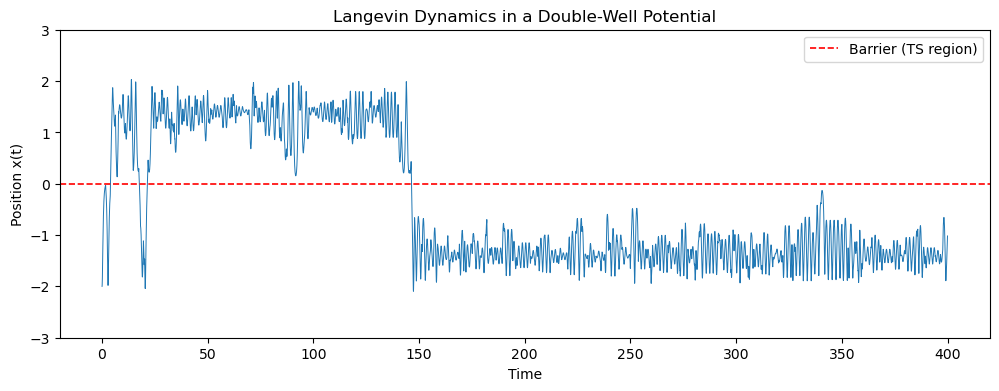

In [5]:
plt.figure(figsize=(12,4))
plt.plot(np.arange(steps)*dt, x, lw=0.7)
plt.axhline(0.0, color='red', ls='--', lw=1.2, label='Barrier (TS region)')
plt.ylim(-3, 3)
plt.xlabel("Time")
plt.ylabel("Position x(t)")
plt.title("Langevin Dynamics in a Double-Well Potential")
plt.legend()
plt.show()

And then prepare an animation showing the position of the particle as a function of time using the trajectory we just generated. Here we first define a function so that we can use it later

In [6]:
def get_animation(xmin, xmax, V_pot, x):
    # Create grid for potential
    xmin = -2.5
    xmax = 2.5
    xs = np.linspace(xmin, xmax, 400)
    betaVs = V_pot(xs) / kT
    
    fig, ax = plt.subplots(figsize=(6,4))
    ax.plot(xs, betaVs, 'k', lw=2)
    particle, = ax.plot([], [], 'ro', ms=8)
    ax.set_xlim(xmin, xmax)
    ax.set_ylim(min(betaVs)-1, max(betaVs)+1)
    ax.set_xlabel('x')
    ax.set_ylabel(r'$\beta$ V(x)')
    ax.set_title('Particle in Double-Well Potential')
    
    def init_animation():
        particle.set_data([], [])
        return particle,
    
    def update(frame):
        particle.set_data(x[frame], V_pot(x[frame]) / kT)
        return particle,
    
    anim = FuncAnimation(fig, update, frames=np.arange(0, steps, 1000),
                         init_func=init_animation, blit=True)
    
    plt.close()
    return anim

Show the animation relative to the "regular" simulation

In [7]:
anim = get_animation(-2.5, 2.5, V, x)
HTML(anim.to_jshtml())

/tmp/ipykernel_3296490/318829961.py:22: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  particle.set_data(x[frame], V_pot(x[frame]) / kT)


## Umbrella Sampling Around the Barrier Top

In unbiased simulations, configurations near the top of the barrier are visited very rarely, making it hard to estimate the free-energy profile there.

To improve sampling of these rare configurations, we use **Umbrella Sampling** (US):

- We add a **harmonic bias** centered at the barrier top $x_0 = 0$:
  $$
  V_\text{bias}(x) = \frac{1}{2} k_\text{bias} (x - x_0)^2
  $$
- This stabilizes the particle near the barrier region.
- From the biased simulation, we collect a histogram $P_\text{bias}(x)$.
- We then **unbias** the distribution:
  $$
  P_\text{unbiased}(x) \propto P_\text{bias}(x)\, e^{\beta V_\text{bias}(x)},
  \quad \beta = 1/(k_B T),
  $$
  and reconstruct the free energy
  $$
  F(x) = -k_B T \ln P_\text{unbiased}(x) + \text{const}.
  $$

In 1D, the theoretical free energy (up to a constant) is simply
$$
F_\text{theory}(x) = V(x),
$$
so we can directly compare the US reconstruction to the known potential.

We start by defining some parameters, as well as the biasing functions

In [8]:
# --- Umbrella (harmonic) bias centered at the barrier top x0=0 ---
k_bias = 10.0
x0 = 0.0

def V_bias(x):
    return 0.5 * k_bias * (x - x0)**2

def dVbias_dx(x):
    return k_bias * (x - x0)

def V_total(x):
    """Total potential used in the umbrella simulation."""
    return V(x) + V_bias(x)

def dVtotal_dx(x):
    """Derivative of the total potential used in dynamics."""
    return dVdx(x) + dVbias_dx(x)

And then run the simulation with the functions defined before

In [9]:
x, v = init()
integrate(x, v, dVtotal_dx, steps)

Generate the animation

In [10]:
anim = get_animation(-2.5, 2.5, V, x)
HTML(anim.to_jshtml())

/tmp/ipykernel_3296490/318829961.py:22: MatplotlibDeprecationWarning: Setting data with a non sequence type is deprecated since 3.7 and will be remove two minor releases later
  particle.set_data(x[frame], V_pot(x[frame]) / kT)


Build biased histogram and unbias it

In [11]:
# Optional (for such a simple system): discard initial part (equilibration)
burn = steps // 5
x_samples = x[burn:]

# Histogram range and bins
nbins = 80
xmin, xmax = -2.5, 2.5

hist, bin_edges = np.histogram(
    x_samples,
    bins=nbins,
    range=(xmin, xmax),
    density=True   # -> hist approximates pdf P_bias(x)
)

bin_centers = 0.5 * (bin_edges[:-1] + bin_edges[1:])

# Biased pdf P_bias(x)
P_bias = hist

# Bias potential at bin centers
Vb_centers = V_bias(bin_centers)

# Unbias:
#   P_unbiased(x) ∝ P_bias(x) * exp(+beta * V_bias(x))
# Free energy: F(x) = -kT ln P_unbiased(x) + const
# Note: F(x) = -kT ln P_bias(x) - V_bias(x) + const

F_biased = np.full_like(P_bias, np.nan, dtype=float)
F_unbiased = np.full_like(P_bias, np.nan, dtype=float)

mask = P_bias > 0
F_biased[mask] = -kT * np.log(P_bias[mask])
F_unbiased[mask] = -kT * np.log(P_bias[mask]) - Vb_centers[mask]

# Theoretical free energy (up to constant): F_th(x) = V(x)
xs = np.linspace(xmin, xmax, 400)

# recalling that we can always shift a free energy arbitrarily,
# we shift the three free energy profiles so that the can be more
# easily plotted on the same figure

# Set the minimum of the unbiased free energy to zero
F_biased -= np.nanmin(F_biased)

# Set the maximum of the unbiased free energy to zero
F_unbiased -= np.nanmax(F_unbiased)

# Shift the maximum of the theoretical free energy to zero
F_th = V(xs) - V_shift

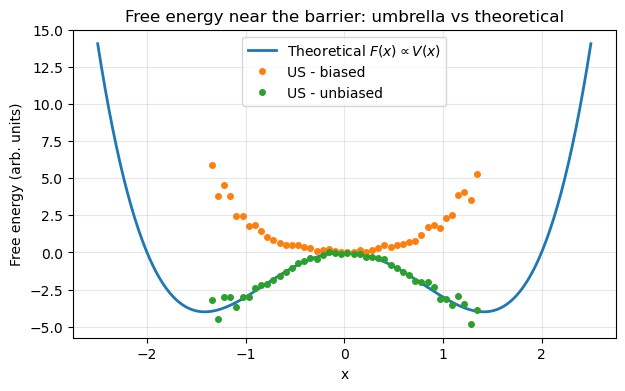

In [12]:
plt.figure(figsize=(7,4))

# Theoretical free energy
plt.plot(xs, F_th, label=r"Theoretical $F(x) \propto V(x)$", lw=2)

# Umbrella reconstruction (only where we have data)
plt.plot(bin_centers, F_biased, 'o', ms=4, label="US - biased")
plt.plot(bin_centers, F_unbiased, 'o', ms=4, label="US - unbiased")

plt.xlabel("x")
plt.ylabel("Free energy (arb. units)")
plt.title("Free energy near the barrier: umbrella vs theoretical")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()